In [1]:
def l(*t):
    print(t)
def ac(model,y_valid,X_valid ):
    print(accuracy_score(y_valid.tolist(),model.predict(X_valid)))
def dist(x1,y1,x2,y2):
    return np.linalg.norm(x1-x2) + np.linalg.norm(y2-y1)

'17 раз до 9 27сек'
'100 3.3 3мин'
import pandas as pd
import numpy as np
import datetime 
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score,roc_curve
from catboost import CatBoostRegressor,Pool,CatBoostClassifier


 reading qwe000000000000.csv
 reading qwe000000000002.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
vendor_id            2000 non-null object
pickup_datetime      2000 non-null datetime64[ns]
pickup_longitude     2000 non-null float64
pickup_latitude      2000 non-null float64
dropoff_longitude    2000 non-null float64
dropoff_latitude     2000 non-null float64
rate_code            729 non-null float64
passenger_count      2000 non-null int64
trip_distance        2000 non-null float64
fare_amount          2000 non-null float64
tolls_amount         2000 non-null float64
dtypes: datetime64[ns](1), float64(8), int64(1), object(1)
memory usage: 172.0+ KB


NameError: name 'r' is not defined

NameError: name 'r' is not defined

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 11 columns):
vendor_id            100 non-null object
pickup_datetime      100 non-null datetime64[ns]
pickup_longitude     100 non-null float64
pickup_latitude      100 non-null float64
dropoff_longitude    100 non-null float64
dropoff_latitude     100 non-null float64
rate_code            22 non-null float64
passenger_count      100 non-null int64
trip_distance        100 non-null float64
fare_amount          100 non-null float64
tolls_amount         100 non-null float64
dtypes: datetime64[ns](1), float64(8), int64(1), object(1)
memory usage: 8.7+ KB
 reading qwe000000000000.csv
 reading qwe000000000002.csv


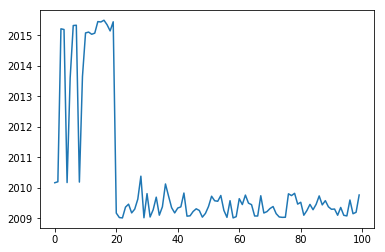

In [2]:
import NumpyAlg as fe
#data=fe.create_features(fe.readCsv(nrows=100))
data=fe.create_features(fe.csvs('qwe0*.csv',nrows=1000
                                *1000
                               ))

#data=fe.data2

In [1]:
data.info()

NameError: name 'data' is not defined

In [4]:
data.describe()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,rate_code,passenger_count,trip_distance,fare,p_hour,p_dayofweek
count,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06,1.643963e+06
mean,-7.397521e+01,4.075073e+01,-7.397437e+01,4.075114e+01,1.028380e+00,1.685409e+00,2.881313e+00,1.152305e+01,1.351261e+01,3.042469e+00
std,6.763001e-02,4.326521e-02,5.499396e-02,4.929883e-02,3.173623e-01,1.318798e+00,3.388435e+00,9.724088e+00,6.522765e+00,1.950922e+00
min,-7.958000e+01,2.065000e+01,-7.974000e+01,1.770000e+01,0.000000e+00,0.000000e+00,1.000000e-02,1.000000e-02,0.000000e+00,0.000000e+00
25%,-7.399000e+01,4.074000e+01,-7.399000e+01,4.074000e+01,1.000000e+00,1.000000e+00,1.050000e+00,6.100000e+00,9.000000e+00,1.000000e+00
50%,-7.398000e+01,4.075000e+01,-7.398000e+01,4.075000e+01,1.000000e+00,1.000000e+00,1.800000e+00,8.500000e+00,1.400000e+01,3.000000e+00
75%,-7.397000e+01,4.077000e+01,-7.397000e+01,4.077000e+01,1.000000e+00,2.000000e+00,3.200000e+00,1.300000e+01,1.900000e+01,5.000000e+00
max,-3.645000e+01,5.199000e+01,-4.312000e+01,5.250000e+01,2.100000e+02,9.000000e+00,5.649000e+02,5.000000e+02,2.300000e+01,6.000000e+00


In [5]:
cat_f_col_ind=np.where(data.dtypes!=np.float)[0]
cat_f_col_ind=[0,1,2,3,4,8,9] # НЕ забудь что 'fare' ты дропаешь!!!

data.dropoff_longitude=data.dropoff_longitude.apply(np.str)
data.dropoff_latitude=data.dropoff_latitude.apply(np.str)
data.pickup_latitude=data.pickup_latitude.apply(np.str)
data.pickup_longitude=data.pickup_longitude.apply(np.str)
data.p_dayofweek=data.p_dayofweek.apply(np.str)
data.p_hour=data.p_hour.apply(np.str)
data.passenger_count=data.passenger_count.apply(np.float)

X=data
X=X.drop('fare',axis=1)
y=data['fare']

from sklearn.model_selection import train_test_split
X_tr, X_valid, y_tr, y_valid=train_test_split(X,y,train_size=0.6)

tr_pool=Pool(X_tr,y_tr,cat_features=cat_f_col_ind)
valid_pool=Pool(X_valid,y_valid,cat_features=cat_f_col_ind)



C:\Users\ayaz\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2026: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [24]:
p={
    # 2.4 - 0.8 100
    # 2.47 - default 
#    'custom_loss':['Accuracy'],
    'iterations':5,
    'learning_rate':0.8,
#    'eval_metric':'Accuracy',
    'random_seed':42,
#    'logging_level':'Silent',
#    'logging_level':'Debug',

#    'use_best_model':True,
#    'save_snapshot':True,

}
m=CatBoostRegressor(**p)
#data.info()

In [30]:
#%matplotlib inline

m.fit(tr_pool, #plot=True
     )

0:	learn: 4.6924216	total: 2.91s	remaining: 11.7s
1:	learn: 3.2936007	total: 4.64s	remaining: 6.95s
2:	learn: 3.0929009	total: 6.46s	remaining: 4.3s
3:	learn: 3.0073372	total: 8.07s	remaining: 2.02s
4:	learn: 2.9572610	total: 9.75s	remaining: 0us


In [8]:
pred=m.predict(X_valid)

#m.score(pred,y_valid)

In [9]:
plt.rcParams['figure.figsize']=(100,10)
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

plt.plot(y_valid.tolist()[:-1000],linewidth=0.1)
plt.plot(pred[:-1000],'red',linewidth=0.2)
m.get_feature_importance()


[0.0,
 0.0,
 0.0,
 0.13955501043818583,
 0.3390567929739865,
 18.550459343733344,
 0.0,
 80.21658829298855,
 0.754340559865946,
 0.0]

In [10]:
#tr_pool.get_cat_feature_hash_to_string()


In [11]:
y_train.tolist()



NameError: name 'y_train' is not defined

In [ ]:
%matplotlib inline
model=m
y_train_pred=pred.tolist()
y_val=y_valid
y_train=y_tr.tolist()


#y_train_pred = model.predict_proba(X_train)[:,1]
print("Train ROC AUC:",roc_auc_score(y_train,y_train_pred))

fpr,tpr,_ = roc_curve(y_train, y_train_pred)
plt.plot(fpr,tpr,label='train AUC')

y_val_pred = model.predict_proba(X_val)[:,1]
print("Val ROC AUC:",roc_auc_score(y_val,y_val_pred))

fpr,tpr,_ = roc_curve(y_val, y_val_pred)
plt.plot(fpr,tpr,label='validation AUC')

plt.plot([0,1],[0,1])
plt.legend(loc='lower right')